# Env setupu

# Env setupu

In [23]:
import scanpy as sc, anndata as ad, numpy as np, pandas as pd
from scipy import sparse
from anndata import AnnData
from pandas.api.types import CategoricalDtype
from matplotlib import pylab
import warnings
import socket
import plotly.express as px
import yaml
from sklearn.cluster import DBSCAN
import holoviews as hv
import seaborn as sns
import os
import sys
import scanpy.external as sce
import matplotlib as plt

warnings.filterwarnings('ignore')

In [24]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
with open("../data/resources/rcParams.yaml") as f:
    rcParamsDict = yaml.full_load(f)
    for k in rcParamsDict["rcParams"]:
        print("{} {}".format(k,rcParamsDict["rcParams"][k]))
        plt.rcParams[k] = rcParamsDict["rcParams"][k]
    for k1 in set(list(rcParamsDict)).difference(set(["rcParams"])):
        print("{} {}".format(k1,rcParamsDict[k1]))
        


scanpy==1.9.3 anndata==0.8.0 umap==0.5.1 numpy==1.20.3 scipy==1.10.1 pandas==2.0.3 scikit-learn==1.3.2 statsmodels==0.13.5 python-igraph==0.9.1 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.12
figure.dpi 80
savefig.dpi 500
figure.figsize [10, 10]
axes.facecolor None
figure.facecolor None
dotSize 20


# Configure paths

In [25]:
outdir = "../data/output"

with open("../data/resources/iPSC_lines_map.yaml", 'r') as f:
    iPSC_lines_map = yaml.load(f, Loader=yaml.FullLoader)["lines"]
colorsmap = dict(zip([i["newName"] for i in iPSC_lines_map.values()],[i["color"] for i in iPSC_lines_map.values()]))


figDir = "./figures"
if not os.path.exists(figDir):
   # Create a new directory because it does not exist
   os.makedirs(figDir)
    
leidenOrder=["ProliferatingProgenitors","RadialGliaProgenitors","OuterRadialGliaAstrocytes","CajalR_like","Neurons","MigratingNeurons","GlutamatergicNeurons_early","GlutamatergicNeurons_late","Interneurons_GAD2","Interneurons"]
dsOrder = ['UpD50', 'DownD50', 'UpD100_1', 'UpD100_2', 'DownD100', 'UpD300', 'DownD250']
cellIDOrder = ['CTL02A', 'CTL08A', 'CTL01', 'CTL04E']

DatasetBasedirs = {
"UpD50" : "../data/Sample_S20272_157/",
"DownD50" :"../data/Sample_S20273_158/",
"UpD100_1" : "../data/Sample_S20812_258/",
"UpD100_2" : "../data/Sample_S20813_259/",
"DownD250" : "../data/Sample_S20814_260/",
"DownD100" : "../data/Sample_S31807_MET6/",
"UpD300" : "../data/Sample_S33846_C_GEX/"
}

In [26]:
adataComp = sc.read(outdir+"/adatas/adataPaga.h5ad")

In [27]:
leidenColorsMaps = dict(zip(adataComp.obs["leidenAnnotated"].cat.categories,adataComp.uns["leidenAnnotated_colors"]))
cellIDColorsMap = dict(zip(adataComp.obs["cellID_newName"].cat.categories, adataComp.uns["cellID_newName_colors"]))


In [28]:
adataComp.obs["cellID_newName"].cat.categories.tolist()

['CTL01', 'CTL02A', 'CTL04E', 'CTL08A']

# Compositions

# Is genotypes distribution consistent between pre and after filtering??

Here we want to check
1) Cell type distribution per dataset
2) ID x Cell type x dataset


## First ID by dataset prior to filter

In [29]:
aggregatedCallsDFDict = {}
for ds in list(DatasetBasedirs.keys()):
    aggregatedCall = pd.read_csv(DatasetBasedirs[ds]+"/aggregatedCall/aggregatedCall.tsv", sep = "\t").rename(columns={"Consensus":"cellID_newName"})
    aggregatedCall.index = aggregatedCall["barcode"].tolist()
    aggregatedCall["dataset"] = ds
    del aggregatedCall["barcode"]
    aggregatedCallsDFDict[ds] = aggregatedCall
    
compositions = pd.concat(list(aggregatedCallsDFDict.values())).replace({iPSC_lines_map[i]["oldName"]:iPSC_lines_map[i]["newName"] for i in list(iPSC_lines_map.keys())})
compositions = compositions[compositions.cellID_newName.isin(adataComp.obs.cellID_newName.unique().tolist())]
compositions = pd.DataFrame(compositions.groupby(["dataset","cellID_newName"]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["dataset"] = compositions["dataset"].astype("category")

fig = px.bar(compositions, x="dataset", y="number_of_cells", color="cellID_newName", 
             category_orders={"dataset":dsOrder,"cellID_newName":cellIDOrder}, height=800,width=1000, template="plotly_white",
             color_discrete_map = dict(zip(adataComp.obs["cellID_newName"].cat.categories, adataComp.uns["cellID_newName_colors"])))

fig.update_traces(marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=1)

fig.update_yaxes(autorange="reversed")

fig.show()

## ID by dataset

In [30]:
compositions = pd.DataFrame(adataComp.obs.groupby(["dataset","cellID_newName"]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
fig = px.bar(compositions, x="dataset", y="number_of_cells", color="cellID_newName", 
             category_orders={"dataset":dsOrder,"cellID_newName":cellIDOrder}, height=800,width=1000, template="plotly_white",
             color_discrete_map = dict(zip(adataComp.obs["cellID_newName"].cat.categories, adataComp.uns["cellID_newName_colors"])))

fig.update_traces(marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=1)

fig.show()


## We observe that Overall ratios between celltypes is preserved after filtering

# Celltype overview by dataset

## Celltype by dataset not norm

In [31]:
compositions = pd.DataFrame(adataComp.obs.groupby(["leidenAnnotated","dataset"]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
fig = px.bar(compositions, x="dataset", y="number_of_cells", color="leidenAnnotated", 
             category_orders={"dataset":dsOrder,
                             "leidenAnnotated":leidenOrder}, height=800,width=1000, template="plotly_white",
             color_discrete_map = dict(zip(adataComp.obs["leidenAnnotated"].cat.categories,adataComp.uns["leidenAnnotated_colors"]))
)

fig.update_traces(marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=1)

fig.show()

## Celltype by dataset norm

In [32]:
compositions = pd.DataFrame(adataComp.obs.groupby(["leidenAnnotated","dataset"]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["number_of_cells_normBycelltype"] = compositions["number_of_cells"] / np.array(compositions.groupby("dataset")["number_of_cells"].sum()[compositions["dataset"].tolist()])

fig = px.bar(compositions, x="dataset", y="number_of_cells_normBycelltype", color="leidenAnnotated", hover_data=compositions,
             category_orders={"dataset":['UpD50', 'DownD50', 'UpD100_1', 'UpD100_2', 'DownD100', 'UpD300', 'DownD250'],
                             "leidenAnnotated":leidenOrder}, height=800,width=1000, template="plotly_white",
             color_discrete_map = dict(zip(adataComp.obs["leidenAnnotated"].cat.categories,adataComp.uns["leidenAnnotated_colors"]))
)

fig.update_traces(marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=1)

fig.show()

# Celltype by stage

In [33]:
compositions = pd.DataFrame(adataComp.obs.groupby(["leidenAnnotated","stage"]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["cellsFraction"] = compositions["number_of_cells"] / np.array(compositions.groupby("stage")["number_of_cells"].sum()[compositions["stage"].tolist()])

fig = px.bar(compositions, x="stage", y="cellsFraction", color="leidenAnnotated", hover_data=compositions,
             category_orders={"stage":['early', 'mid', 'late'],
                             "leidenAnnotated":leidenOrder}, height=800,width=1000, template="plotly_white",
             color_discrete_map = dict(zip(adataComp.obs["leidenAnnotated"].cat.categories,adataComp.uns["leidenAnnotated_colors"]))
)

fig.update_traces(marker_line_color='black',
                  marker_line_width=1, opacity=1)

fig.update_layout(
yaxis = dict(tickfont = dict(size=30)),
xaxis = dict(tickfont = dict(size=30)))

fig.show()
fig.write_image(figDir+"/Compositions.CelltypeByStage.pdf")

# Celltype by type

In [34]:
compositions = pd.DataFrame(adataComp.obs.groupby(["leidenAnnotated","type"]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["cellsFraction"] = compositions["number_of_cells"] / np.array(compositions.groupby("type")["number_of_cells"].sum()[compositions["type"].tolist()])

fig = px.bar(compositions, x="type", y="cellsFraction", color="leidenAnnotated", hover_data=compositions,
             category_orders={"type":['upstream', 'downstream'],
                             "leidenAnnotated":leidenOrder}, height=800,width=1000, template="plotly_white",
             color_discrete_map = dict(zip(adataComp.obs["leidenAnnotated"].cat.categories,adataComp.uns["leidenAnnotated_colors"]))
)

fig.update_traces(marker_line_color='black',
                  marker_line_width=1, opacity=1)

fig.update_layout(
yaxis = dict(tickfont = dict(size=30)),
xaxis = dict(tickfont = dict(size=30)))

fig.show()
fig.write_image(figDir+"/Compositions.CelltypeByType.pdf")

# Celltype by stage divided by paradigm

In [35]:
for paradigm in adataComp.obs.type.unique():
    adataCompStage = adataComp[adataComp.obs["type"] == paradigm]
    compositions = pd.DataFrame(adataCompStage.obs.groupby(["leidenAnnotated","stage"]).size())
    compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
    compositions["cells_fraction"] = compositions["number_of_cells"] / np.array(compositions.groupby("stage")["number_of_cells"].sum()[compositions["stage"].tolist()])

    fig = px.bar(compositions, x="stage", y="cells_fraction", color="leidenAnnotated", hover_data=compositions,
                 category_orders={"stage":['early', 'mid', 'late'],
                                 "leidenAnnotated":leidenOrder}, height=800,width=1000, template="plotly_white",title=paradigm,
                 color_discrete_map = dict(zip(adataCompStage.obs["leidenAnnotated"].cat.categories,adataCompStage.uns["leidenAnnotated_colors"]))
    )

    fig.update_traces(marker_line_color='black',
                      marker_line_width=1, opacity=1)

    fig.update_layout(
    yaxis = dict(tickfont = dict(size=30)),
    xaxis = dict(tickfont = dict(size=30)))

    fig.write_image(figDir+"/Compositions.CelltypeByStage."+paradigm+".pdf")
    fig.show()
    

# Are cellt types equally distributed among genotypes?

## ID by celltype by dataset (norm)

In [45]:
compositions

,leidenAnnotated,stage,number_of_cells,cells_fraction
0,CajalR_like,early,1,0.001196
1,CajalR_like,mid,217,0.138570
2,CajalR_like,late,1,0.000191
3,GlutamatergicNeurons_early,early,124,0.148325
4,GlutamatergicNeurons_early,mid,124,0.079183
5,GlutamatergicNeurons_early,late,88,0.016768
6,GlutamatergicNeurons_late,early,2,0.002392
7,GlutamatergicNeurons_late,mid,40,0.025543
8,GlutamatergicNeurons_late,late,1680,0.320122
9,Interneurons,early,0,0.000000


In [37]:
for ds in dsOrder:
    
    adataCompDS = adataComp[adataComp.obs["dataset"] == ds]
    
    compositions = pd.DataFrame(adataCompDS.obs.groupby(["leidenAnnotated","cellID_newName"]).size())
    compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
    compositions["number_of_cells_normBycelltype"] = compositions["number_of_cells"] / np.array(compositions.groupby("leidenAnnotated")["number_of_cells"].sum()[compositions["leidenAnnotated"].tolist()])
    
    #Keep only celltypes with at least n total cells regardless ID
    totPertype = compositions.groupby("leidenAnnotated")["number_of_cells"].sum()
    LeidenSelection = totPertype[totPertype / totPertype.sum() > .05].index.tolist()    
    compositions = compositions[compositions.leidenAnnotated.isin(LeidenSelection)]
    
    fig = px.bar(compositions, x="leidenAnnotated", y="number_of_cells_normBycelltype", color="cellID_newName", 
             category_orders={"dataset":["early", "mid", "late",],"leidenAnnotated":[l for l in leidenOrder if l in compositions["leidenAnnotated"].unique()]}, height=800,width=1000, title=ds,template="plotly_white",
             color_discrete_map = dict(zip(adataCompDS.obs["cellID_newName"].cat.categories, adataCompDS.uns["cellID_newName_colors"])))

    fig.update_traces(marker_line_color='rgb(8,48,107)',width=.97,
                  marker_line_width=1.5, opacity=1)
    
    fig.show()

## ID by celltype by dataset (not norm)

In [38]:
adataComp.obs.groupby(["leidenAnnotated","cellID_newName"]).size().max()

1722

In [39]:
threshold=0
for ds in dsOrder:
    
    adataCompDS = adataComp[adataComp.obs["dataset"] == ds]
    
    compositions = pd.DataFrame(adataCompDS.obs.groupby(["leidenAnnotated","cellID_newName"]).size())
    compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
    compositions["number_of_cells_normBycelltype"] = compositions["number_of_cells"] / np.array(compositions.groupby("leidenAnnotated")["number_of_cells"].sum()[compositions["leidenAnnotated"].tolist()])
    
    #Keep only celltypes with at least n total cells regardless ID
    totPertype = compositions.groupby("leidenAnnotated")["number_of_cells"].sum()
    LeidenSelection = totPertype[totPertype / totPertype.sum() > .05].index.tolist()    
    compositions = compositions[compositions.leidenAnnotated.isin(LeidenSelection)]
    
    fig = px.bar(compositions, x="leidenAnnotated", y="number_of_cells", color="cellID_newName", 
             category_orders={"dataset":["early", "mid", "late",],"leidenAnnotated":[l for l in leidenOrder if l in compositions["leidenAnnotated"].unique()]}, height=800,width=1000, title=ds,template="plotly_white",
             color_discrete_map = dict(zip(adataCompDS.obs["cellID_newName"].cat.categories, adataCompDS.uns["cellID_newName_colors"])))

    fig.update_traces(marker_line_color='rgb(8,48,107)',width=.97,
                  marker_line_width=1.5, opacity=1)
    fig.update_layout(yaxis_range=[0,adataComp.obs.groupby(["leidenAnnotated","cellID_newName"]).size().max()])


    fig.show()

## No evident cell-type byas per genotype is highlighted in chimeric models with respect to their no chimeric counterpart

# Same as above but looking at compositions within genotype

In [40]:
totPertype

leidenAnnotated
CajalR_like                     3
GlutamatergicNeurons_early     13
GlutamatergicNeurons_late     204
Interneurons                  805
Interneurons_GAD2               1
Neurons                         4
OuterRadialGliaAstrocytes     207
ProliferatingProgenitors      182
RadialGliaProgenitors         207
intermediateProgenitors       145
Name: number_of_cells, dtype: int64

In [41]:
for ds in dsOrder:
    
    adataCompDS = adataComp[adataComp.obs["dataset"] == ds]
    
    compositions = pd.DataFrame(adataCompDS.obs.groupby(["cellID_newName","leidenAnnotated"]).size())
    compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
    
    #Keep only celltypes with at least n total cells regardless ID
    totPertype = compositions.groupby("leidenAnnotated")["number_of_cells"].sum()
    LeidenSelection = totPertype[totPertype / totPertype.sum() > .05].index.tolist()    
    compositions = compositions[compositions.leidenAnnotated.isin(LeidenSelection)]

    
    #Keep only IDs with at least 100 cells by dataset
    totPertype = compositions.groupby("cellID_newName")["number_of_cells"].sum()
    IDSelection = totPertype[totPertype <= 30].index.tolist()    
    
    compositions.loc[compositions.cellID_newName.isin(IDSelection),"number_of_cells"] = 0
    compositions
    
    
    compositions["number_of_cells_normBygenotype"] = compositions["number_of_cells"] / np.array(compositions.groupby("cellID_newName")["number_of_cells"].sum()[compositions["cellID_newName"].tolist()])


    lines = [l for l in adataComp.obs["cellID_newName"].cat.categories.tolist() if l in adataCompDS.obs["cellID_newName"].cat.categories.tolist()]
    fig = px.bar(compositions, x="cellID_newName", y="number_of_cells_normBygenotype", color="leidenAnnotated", 
             category_orders={"cellID_newName":lines}, 
                 height=800,width=1000, title=ds,template="plotly_white",
             color_discrete_map = leidenColorsMaps)
    
    
    x_labels = lines
    totals = compositions.groupby("cellID_newName")["number_of_cells"].sum()[lines]
    total_labels = [{"x": x, "y": 1.1, "text": str(total), "showarrow": False} for x, total in zip(x_labels, totals)]


    fig.update_traces(marker_line_color='rgb(0,0,0)',width=.97,
                  marker_line_width=1.5, opacity=1)

    fig.update_layout(annotations=total_labels)
    
    fig.show()

In [42]:
threshold=0
for ds in dsOrder:
    
    adataCompDS = adataComp[adataComp.obs["dataset"] == ds]
    
    compositions = pd.DataFrame(adataCompDS.obs.groupby(["leidenAnnotated","cellID_newName"]).size())
    compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
    compositions["number_of_cells_normBycelltype"] = compositions["number_of_cells"] / np.array(compositions.groupby("leidenAnnotated")["number_of_cells"].sum()[compositions["leidenAnnotated"].tolist()])
    
    #Keep only celltypes with at least n total cells regardless ID
    totPertype = compositions.groupby("leidenAnnotated")["number_of_cells"].sum()
    LeidenSelection = totPertype[totPertype / totPertype.sum() > .05].index.tolist()    
    compositions = compositions[compositions.leidenAnnotated.isin(LeidenSelection)]
    
    fig = px.bar(compositions, x="leidenAnnotated", y="number_of_cells", color="cellID_newName", 
             category_orders={"dataset":["early", "mid", "late",],"leidenAnnotated":[l for l in leidenOrder if l in compositions["leidenAnnotated"].unique()]}, height=800,width=1000, title=ds,template="plotly_white",
             color_discrete_map = dict(zip(adataCompDS.obs["cellID_newName"].cat.categories, adataCompDS.uns["cellID_newName_colors"])))

    fig.update_traces(marker_line_color='rgb(8,48,107)',width=.97,
                  marker_line_width=1.5, opacity=1)
    fig.update_layout(yaxis_range=[0,adataComp.obs.groupby(["leidenAnnotated","cellID_newName"]).size().max()])


    fig.show()

# Most abundant genotype (CTL02A) longitudinal characterization

late


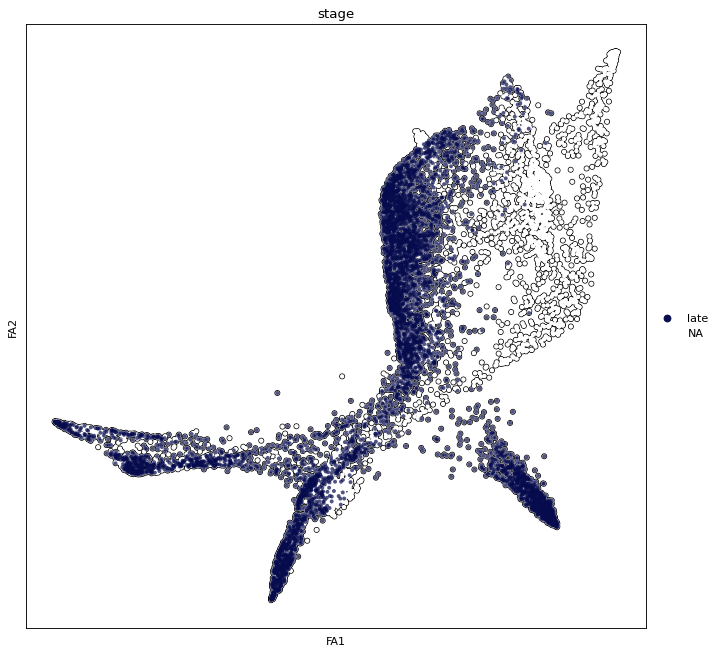

mid


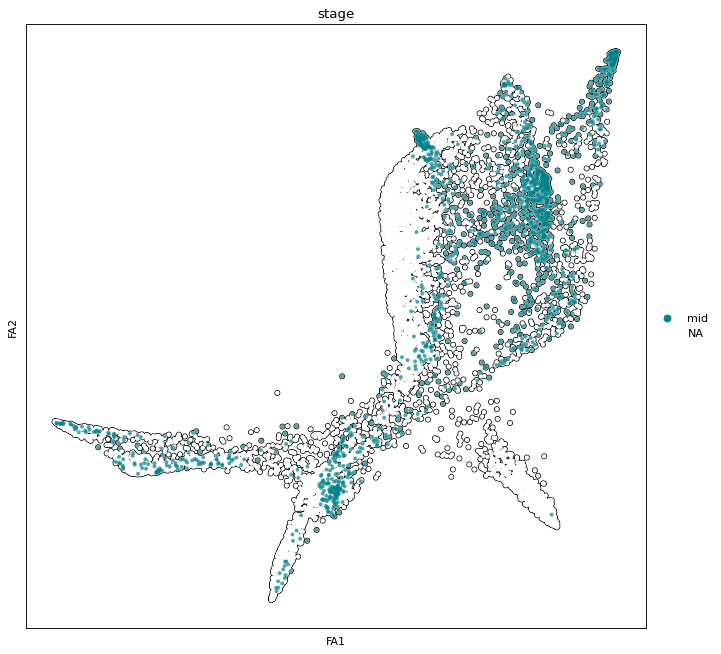

early


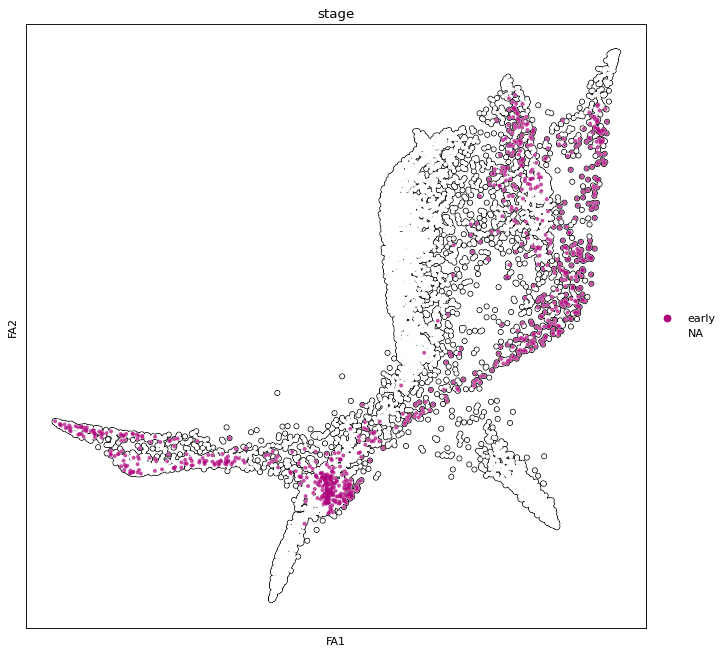

In [53]:
rcParamsDict["rcParams"]["savefig.dpi"] = 700
for i in adataComp.obs["stage"].unique().tolist():
    print(i)
    sc.pl.draw_graph(adataComp[adataComp.obs["cellID_newName"] == "CTL02A"], color = ["stage"],groups=i,size =  50,
                     add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', wspace=.4, ncols=2, na_color="white", save="CTL02A.{}.png".format(i))
rcParamsDict["rcParams"]["savefig.dpi"] = 500

In [44]:
adataCompStage = adataComp[adataComp.obs["cellID_newName"] == "CTL02A"]
compositions = pd.DataFrame(adataCompStage.obs.groupby(["leidenAnnotated","stage"]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["cells_fraction"] = compositions["number_of_cells"] / np.array(compositions.groupby("stage")["number_of_cells"].sum()[compositions["stage"].tolist()])

fig = px.bar(compositions, x="stage", y="cells_fraction", color="leidenAnnotated", hover_data=compositions,
                category_orders={"stage":['early', 'mid', 'late'],
                                "leidenAnnotated":leidenOrder}, height=800,width=1000, template="plotly_white",title=paradigm,
                color_discrete_map = dict(zip(adataCompStage.obs["leidenAnnotated"].cat.categories,adataCompStage.uns["leidenAnnotated_colors"]))
)

fig.update_traces(marker_line_color='black',
                    marker_line_width=1, opacity=1)

fig.update_layout(
yaxis = dict(tickfont = dict(size=30)),
xaxis = dict(tickfont = dict(size=30)))

fig.write_image(figDir+"/Compositions.CelltypeByStage.CTL02A."+paradigm+".pdf")
fig.show()


# MILO mosaic vs downstream

In [ ]:
import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging

In [ ]:
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

In [ ]:
anndata2ri.activate()

In [ ]:
%load_ext rpy2.ipython

In [ ]:
%%R
library(miloR)
library(igraph)
library(ggplot2)

In [ ]:
#Adata
cov = "type"
adataMilo = sc.read_h5ad(outdir+"/adatas/ClusterAnnotated_Base_filt.h5ad")
adataCMB = adataMilo.copy()
adata_no_knn = adataCMB.copy()
adata_no_knn.obsp = None
adata_no_knn.uns.pop("neighbors")
del adata_no_knn.uns
del adata_no_knn.varm
del adata_no_knn.obsm
#adata_no_knn.uns.pop("nhoods")
#adata_no_knn.X = adata_no_knn.X.todense()
adata_no_knn.obsm["X_pca"] = adataCMB.obsm["X_pca"].copy()
adata_no_knn.obsm["X_umap"] = adataCMB.obsm["X_umap"].copy()
adata_no_knn.obsm["X_draw_graph_fa"] = adataCMB.obsm["X_draw_graph_fa"].copy()


levelsOrder = adataCMB.obs["stage"].unique().tolist()
levelsOrder

['late', 'mid', 'early']

In [ ]:
# DesignMAtrix
design_df = adataCMB.obs[["dataset",cov]]
design_df.drop_duplicates(inplace=True)
design_df.index = design_df['dataset']
design_df

,dataset,type
dataset,,
DownD250,DownD250,downstream
UpD300,UpD300,upstream
DownD100,DownD100,downstream
UpD100_1,UpD100_1,upstream
UpD100_2,UpD100_2,upstream
DownD50,DownD50,downstream
UpD50,UpD50,upstream


In [ ]:
%%R -i adata_no_knn

milo <- Milo(adata_no_knn)
milo <- buildGraph(milo, k=20, d=30)
milo


class: Milo 
dim: 3499 14913 
metadata(0):
assays(1): X
rownames(3499): LINC00115 AL645608.7 ... MT-ND6 MT-CYB
rowData names(3): highly_variable mean std
colnames(14913): AAACCTGAGAGACTAT-1_DownD250
  AAACCTGCATGGTTGT-1_DownD250 ... TTTGTCATCGCGTAGC-1_UpD50
  TTTGTCATCGTTTATC-1_UpD50
colData names(21): dataset cellID ... phase leidenAnnotated
reducedDimNames(3): PCA UMAP X_draw_graph_fa
altExpNames(0):
nhoods dimensions(2): 1 1
nhoodCounts dimensions(2): 1 1
nhoodDistances dimension(1): 0
graph names(1): graph
nhoodIndex names(1): 0
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(0):
nhoodAdjacency dimension(2): 1 1


In [ ]:
%%R -i design_df -i levelsOrder -o DA_results


milo <- makeNhoods(milo, prop = 0.1, k = 20, d=20, refined = TRUE)

milo <- countCells(milo, meta.data = data.frame(colData(milo)), sample="dataset")


milo <- calcNhoodDistance(milo, d=20)


DA_results <- testNhoods(milo, design = ~ type, design.df = design_df)

In [ ]:
DA_results

,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
1,1.424080,10.556788,0.866836,0.364845,0.999981,1.0,0.999916
2,-4.277507,9.699288,4.342086,0.054664,0.999981,2.0,0.999916
3,-0.447931,9.651080,0.088348,0.769883,0.999981,3.0,0.999916
4,-2.997033,10.856179,2.367230,0.142281,0.999981,4.0,0.999916
5,-0.249615,10.228927,0.028334,0.868309,0.999981,5.0,0.999916
...,...,...,...,...,...,...,...
1131,-1.460117,10.839501,0.575498,0.458455,0.999981,1131.0,0.999916
1132,-0.454092,9.867350,0.145664,0.707230,0.999981,1132.0,0.999916
1133,-0.882321,9.304435,0.288003,0.598445,0.999981,1133.0,0.999916
1134,-1.850301,10.456192,1.241623,0.280639,0.999981,1134.0,0.999916


In [ ]:
%%R
milo <- buildNhoodGraph(milo)

In [ ]:
%%R
milo

class: Milo 
dim: 3499 14913 
metadata(0):
assays(1): X
rownames(3499): LINC00115 AL645608.7 ... MT-ND6 MT-CYB
rowData names(3): highly_variable mean std
colnames(14913): AAACCTGAGAGACTAT-1_DownD250
  AAACCTGCATGGTTGT-1_DownD250 ... TTTGTCATCGCGTAGC-1_UpD50
  TTTGTCATCGTTTATC-1_UpD50
colData names(21): dataset cellID ... phase leidenAnnotated
reducedDimNames(3): PCA UMAP X_draw_graph_fa
altExpNames(0):
nhoods dimensions(2): 14913 1135
nhoodCounts dimensions(2): 1135 7
nhoodDistances dimension(1): 1135
graph names(1): graph
nhoodIndex names(1): 1135
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(1): nhoodGraph
nhoodAdjacency dimension(2): 1135 1135


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


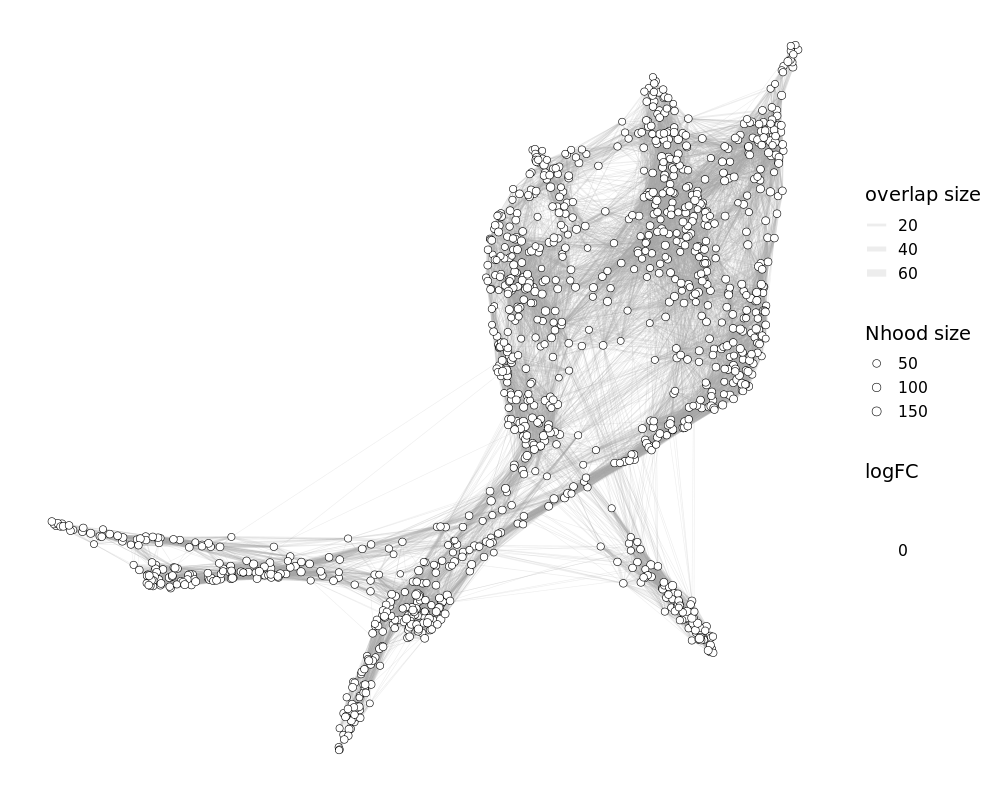

In [ ]:
%%R -w 1000 -h 800 -r 100

plotNhoodGraphDA(milo, DA_results,  alpha=.1,size_range=c(2,3), layout="X_draw_graph_fa")+
  scale_fill_gradient2(high='#be1622', mid='white', low="#534ca3", name="logFC")+ theme(
  panel.background = element_rect(fill = "transparent",
                                  colour = NA_character_), # necessary to avoid drawing panel outline
  panel.grid.major = element_blank(), # get rid of major grid
  panel.grid.minor = element_blank(), # get rid of minor grid
  plot.background = element_rect(fill = "transparent",
                                 colour = NA_character_), # necessary to avoid drawing plot outline
  legend.background = element_rect(fill = "transparent"),
)

In [ ]:
%%R -i figDir
ggsave(
  paste0(figDir,"/DA.logFC.upstream_vs_downstream.png"),
  plot = last_plot(),
  device = "png",
  scale = 1,bg = "transparent",
  width = 2200,
  height = 1640,
  units = c("px"),
  dpi = 300)

# MILO mod: Anova like Stage wise vs all

In [ ]:
import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging

In [ ]:
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

In [ ]:
anndata2ri.activate()

In [ ]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [ ]:
%%R
library(miloR)
library(igraph)
library(ggplot2)
library(ggplot2)

In [ ]:
#Adata
cov = "stage"
adataMilo = sc.read_h5ad(outdir+"/adatas/ClusterAnnotated_Base_filt.h5ad")
adataCMB = adataMilo.copy()
adata_no_knn = adataCMB.copy()
adata_no_knn.obsp = None
adata_no_knn.uns.pop("neighbors")
del adata_no_knn.uns
del adata_no_knn.varm
del adata_no_knn.obsm
#adata_no_knn.uns.pop("nhoods")
#adata_no_knn.X = adata_no_knn.X.todense()
adata_no_knn.obsm["X_pca"] = adataCMB.obsm["X_pca"].copy()
adata_no_knn.obsm["X_umap"] = adataCMB.obsm["X_umap"].copy()
adata_no_knn.obsm["X_draw_graph_fa"] = adataCMB.obsm["X_draw_graph_fa"].copy()


levelsOrder = adataCMB.obs["stage"].unique().tolist()
levelsOrder

['late', 'mid', 'early']

In [ ]:
# DesignMAtrix
design_df = adataCMB.obs[["dataset","stage"]]
design_df.drop_duplicates(inplace=True)
design_df.index = design_df['dataset']
design_df

,dataset,stage
dataset,,
DownD250,DownD250,late
UpD300,UpD300,late
DownD100,DownD100,mid
UpD100_1,UpD100_1,mid
UpD100_2,UpD100_2,mid
DownD50,DownD50,early
UpD50,UpD50,early


In [ ]:
%%R -i adata_no_knn

milo <- Milo(adata_no_knn)
milo <- buildGraph(milo, k=20, d=30)
milo


class: Milo 
dim: 3499 14913 
metadata(0):
assays(1): X
rownames(3499): LINC00115 AL645608.7 ... MT-ND6 MT-CYB
rowData names(3): highly_variable mean std
colnames(14913): AAACCTGAGAGACTAT-1_DownD250
  AAACCTGCATGGTTGT-1_DownD250 ... TTTGTCATCGCGTAGC-1_UpD50
  TTTGTCATCGTTTATC-1_UpD50
colData names(21): dataset cellID ... phase leidenAnnotated
reducedDimNames(3): PCA UMAP X_draw_graph_fa
altExpNames(0):
nhoods dimensions(2): 1 1
nhoodCounts dimensions(2): 1 1
nhoodDistances dimension(1): 0
graph names(1): graph
nhoodIndex names(1): 0
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(0):
nhoodAdjacency dimension(2): 1 1


In [ ]:
%%R

#' @export
#' @importFrom stats model.matrix
#' @importFrom Matrix colSums rowMeans
#' @importFrom stats dist median
#' @importFrom limma makeContrasts
#' @importFrom edgeR DGEList estimateDisp glmQLFit glmQLFTest topTags calcNormFactors


.check_empty <- function(x, attribute){
    # check if a Milo object slot is empty or not
    x.slot <- slot(x, attribute)

    if(is.list(x.slot) & names(slot(x, "graph")) == "graph"){
        return(length(x.slot[[1]]) > 0)
    } else if(is.list(x.slot) & is.null(names(x.slot))){
        return(length(x.slot))
    } else if(any(class(x.slot) %in% c("dgCMatrix", "dsCMatrix", "ddiMatrix", "matrix"))){
        return(sum(rowSums(x.slot)) == 0)
    }
}





testNhoods_mod <- function(x, design, design.df,
                       fdr.weighting=c("k-distance", "neighbour-distance", "max", "graph-overlap", "none"),
                       min.mean=0, model.contrasts=NULL, robust=TRUE, reduced.dim="PCA",design.coef=NULL, design.mcontrast=NULL, 
                       norm.method=c("TMM", "RLE", "logMS")){
    if(is(design, "formula")){
        model <- model.matrix(design, data=design.df)
        rownames(model) <- rownames(design.df)
    } else if(is(design, "matrix")){
        model <- design
        if(nrow(model) != nrow(design.df)){
            stop("Design matrix and model matrix are not the same dimensionality")
        }

        if(any(rownames(model) != rownames(design.df))){
            warning("Design matrix and model matrix dimnames are not the same")
            # check if rownames are a subset of the design.df
            check.names <- any(rownames(model) %in% rownames(design.df))
            if(isTRUE(check.names)){
                rownames(model) <- rownames(design.df)
            } else{
                stop("Design matrix and model matrix rownames are not a subset")
            }
        }
    }

    if(!is(x, "Milo")){
        stop("Unrecognised input type - must be of class Milo")
    } else if(.check_empty(x, "nhoodCounts")){
        stop("Neighbourhood counts missing - please run countCells first")
    }

    if(!any(norm.method %in% c("TMM", "logMS", "RLE"))){
        stop("Normalisation method ", norm.method, " not recognised. Must be either TMM, RLE or logMS")
    }

    if(!reduced.dim %in% reducedDimNames(x)){
        stop(reduced.dim, " is not found in reducedDimNames. Avaiable options are ", paste(reducedDimNames(x), collapse=","))
    }

    subset.counts <- FALSE
    if(ncol(nhoodCounts(x)) != nrow(model)){
        # need to allow for design.df with a subset of samples only
        if(all(rownames(model) %in% colnames(nhoodCounts(x)))){
            message("Design matrix is a strict subset of the nhood counts")
            subset.counts <- TRUE
        } else{
            stop("Design matrix (", nrow(model), ") and nhood counts (",
                 ncol(nhoodCounts(x)), ") are not the same dimension")
        }
    }

    # assume nhoodCounts and model are in the same order
    # cast as DGEList doesn't accept sparse matrices
    # what is the cost of cast a matrix that is already dense vs. testing it's class
    if(min.mean > 0){
        if(isTRUE(subset.counts)){
            keep.nh <- rowMeans(nhoodCounts(x)[, rownames(model)]) >= min.mean
        } else{
            keep.nh <- rowMeans(nhoodCounts(x)) >= min.mean
        }
    } else{
        if(isTRUE(subset.counts)){
            keep.nh <- rep(TRUE, nrow(nhoodCounts(x)[, rownames(model)]))
        }else{
            keep.nh <- rep(TRUE, nrow(nhoodCounts(x)))
        }
    }

    if(isTRUE(subset.counts)){
        keep.samps <- intersect(rownames(model), colnames(nhoodCounts(x)[keep.nh, ]))
    } else{
        keep.samps <- colnames(nhoodCounts(x)[keep.nh, ])
    }

    if(any(colnames(nhoodCounts(x)[keep.nh, keep.samps]) != rownames(model)) & !any(colnames(nhoodCounts(x)[keep.nh, keep.samps]) %in% rownames(model))){
        stop("Sample names in design matrix and nhood counts are not matched.
             Set appropriate rownames in design matrix.")
    } else if(any(colnames(nhoodCounts(x)[keep.nh, keep.samps]) != rownames(model)) & any(colnames(nhoodCounts(x)[keep.nh, keep.samps]) %in% rownames(model))){
        warning("Sample names in design matrix and nhood counts are not matched. Reordering")
        model <- model[colnames(nhoodCounts(x)[keep.nh, keep.samps]), ]
    }

    if(length(norm.method) > 1){
        message("Using TMM normalisation")
        dge <- DGEList(counts=nhoodCounts(x)[keep.nh, keep.samps],
                       lib.size=colSums(nhoodCounts(x)[keep.nh, keep.samps]))
        dge <- calcNormFactors(dge, method="TMM")
    } else if(norm.method %in% c("TMM")){
        message("Using TMM normalisation")
        dge <- DGEList(counts=nhoodCounts(x)[keep.nh, keep.samps],
                       lib.size=colSums(nhoodCounts(x)[keep.nh, keep.samps]))
        dge <- calcNormFactors(dge, method="TMM")
    } else if(norm.method %in% c("RLE")){
        message("Using RLE normalisation")
        dge <- DGEList(counts=nhoodCounts(x)[keep.nh, keep.samps],
                       lib.size=colSums(nhoodCounts(x)[keep.nh, keep.samps]))
        dge <- calcNormFactors(dge, method="RLE")
    }else if(norm.method %in% c("logMS")){
        message("Using logMS normalisation")
        dge <- DGEList(counts=nhoodCounts(x)[keep.nh, keep.samps],
                       lib.size=colSums(nhoodCounts(x)[keep.nh, keep.samps]))
    }
    print(model)
    dge <- estimateDisp(dge, model)
    fit <- glmQLFit(dge, model, robust=robust)
    if(!is.null(model.contrasts)){
        mod.constrast <- makeContrasts(contrasts=model.contrasts, levels=model)
        res <- as.data.frame(topTags(glmQLFTest(fit, contrast=mod.constrast),
                                     sort.by='none', n=Inf))
    } else if (!is.null(design.coef)) {
        n.coef <- design.coef
        res <- as.data.frame(topTags(glmQLFTest(fit, coef=n.coef), sort.by='none', n=Inf))
    } else if (!is.null(design.mcontrast)) {
        res <- as.data.frame(topTags(glmQLFTest(fit, contrast=design.mcontrast), sort.by='none', n=Inf))
    } else{
        n.coef <- ncol(model)
        res <- as.data.frame(topTags(glmQLFTest(fit, coef=n.coef), sort.by='none', n=Inf))
    }
             

    res$Nhood <- as.numeric(rownames(res))
    message("Performing spatial FDR correction with", fdr.weighting[1], " weighting")
    mod.spatialfdr <- graphSpatialFDR(x.nhoods=nhoods(x),
                                      graph=graph(x),
                                      weighting=fdr.weighting,
                                      k=x@.k,
                                      pvalues=res[order(res$Nhood), ]$PValue,
                                      indices=nhoodIndex(x),
                                      distances=nhoodDistances(x),
                                      reduced.dimensions=reducedDim(x, reduced.dim))

    res$SpatialFDR[order(res$Nhood)] <- mod.spatialfdr
    res
}

In [ ]:
%%R -i design_df -i levelsOrder -o DA_results


milo <- makeNhoods(milo, prop = 0.1, k = 20, d=20, refined = TRUE)

milo <- countCells(milo, meta.data = data.frame(colData(milo)), sample="dataset")


milo <- calcNhoodDistance(milo, d=20)

model <- model.matrix(~0+stage, data=design_df)
rownames(model) <- rownames(design_df)
print(model)

contrasts <- makeContrasts("late_vs_all" = stagelate-(stagemid+stageearly)/2,
                           "mid_vs_all" = stagemid-(stageearly+stagelate)/2,
                           "early_vs_all" = stageearly-(stagelate+stagemid)/2,
                           levels = model)

print(contrasts)
DA_results <- testNhoods_mod(milo, design = ~0+stage, design.df = design_df, design.mcontrast=contrasts)

From cffi callback <function _processevents at 0x1554e3426f70>:
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/rpy2/rinterface_lib/callbacks.py", line 277, in _processevents
    try:
KeyboardInterrupt


         stageearly stagemid stagelate
DownD250          0        0         1
UpD300            0        0         1
DownD100          0        1         0
UpD100_1          0        1         0
UpD100_2          0        1         0
DownD50           1        0         0
UpD50             1        0         0
attr(,"assign")
[1] 1 1 1
attr(,"contrasts")
attr(,"contrasts")$stage
[1] "contr.poly"

            Contrasts
Levels       late_vs_all mid_vs_all early_vs_all
  stageearly        -0.5       -0.5          1.0
  stagemid          -0.5        1.0         -0.5
  stagelate          1.0       -0.5         -0.5
         stageearly stagemid stagelate
UpD50             1        0         0
DownD50           1        0         0
UpD100_1          0        1         0
UpD100_2          0        1         0
DownD100          0        1         0
UpD300            0        0         1
DownD250          0        0         1


In [ ]:
DA_results

,logFC.late_vs_all,logFC.mid_vs_all,logFC.early_vs_all,logCPM,F,PValue,FDR,Nhood,SpatialFDR
1,2.692140,-5.211017,2.518877,9.283284,2.041241,0.129986,0.159401,1.0,0.156349
2,-6.304006,2.632928,3.671079,10.132353,4.528253,0.010848,0.019429,2.0,0.019093
3,-5.185975,0.484936,4.701039,9.692885,4.141955,0.015952,0.026774,3.0,0.026240
4,-6.189369,2.879279,3.310091,10.028704,4.036426,0.017724,0.029274,4.0,0.028747
5,-2.083283,0.495335,1.587948,9.666917,0.875516,0.416717,0.459074,5.0,0.451941
...,...,...,...,...,...,...,...,...,...
1134,-0.342064,-0.613208,0.955272,10.407881,0.403690,0.667875,0.701793,1134.0,0.694615
1135,2.438576,-0.183092,-2.255484,10.751215,3.503312,0.030179,0.045852,1135.0,0.044911
1136,-5.617211,1.283279,4.333931,9.806550,3.970403,0.018931,0.031043,1136.0,0.030478
1137,7.795414,-3.897707,-3.897707,10.331951,13.029206,0.000002,0.000019,1137.0,0.000020


In [ ]:
%%R
milo <- buildNhoodGraph(milo)

In [ ]:
%%R
milo

class: Milo 
dim: 3499 14913 
metadata(0):
assays(1): X
rownames(3499): LINC00115 AL645608.7 ... MT-ND6 MT-CYB
rowData names(3): highly_variable mean std
colnames(14913): AAACCTGAGAGACTAT-1_DownD250
  AAACCTGCATGGTTGT-1_DownD250 ... TTTGTCATCGCGTAGC-1_UpD50
  TTTGTCATCGTTTATC-1_UpD50
colData names(21): dataset cellID ... phase leidenAnnotated
reducedDimNames(3): PCA UMAP X_draw_graph_fa
altExpNames(0):
nhoods dimensions(2): 14913 1138
nhoodCounts dimensions(2): 1138 7
nhoodDistances dimension(1): 1138
graph names(1): graph
nhoodIndex names(1): 1138
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(1): nhoodGraph
nhoodAdjacency dimension(2): 1138 1138


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


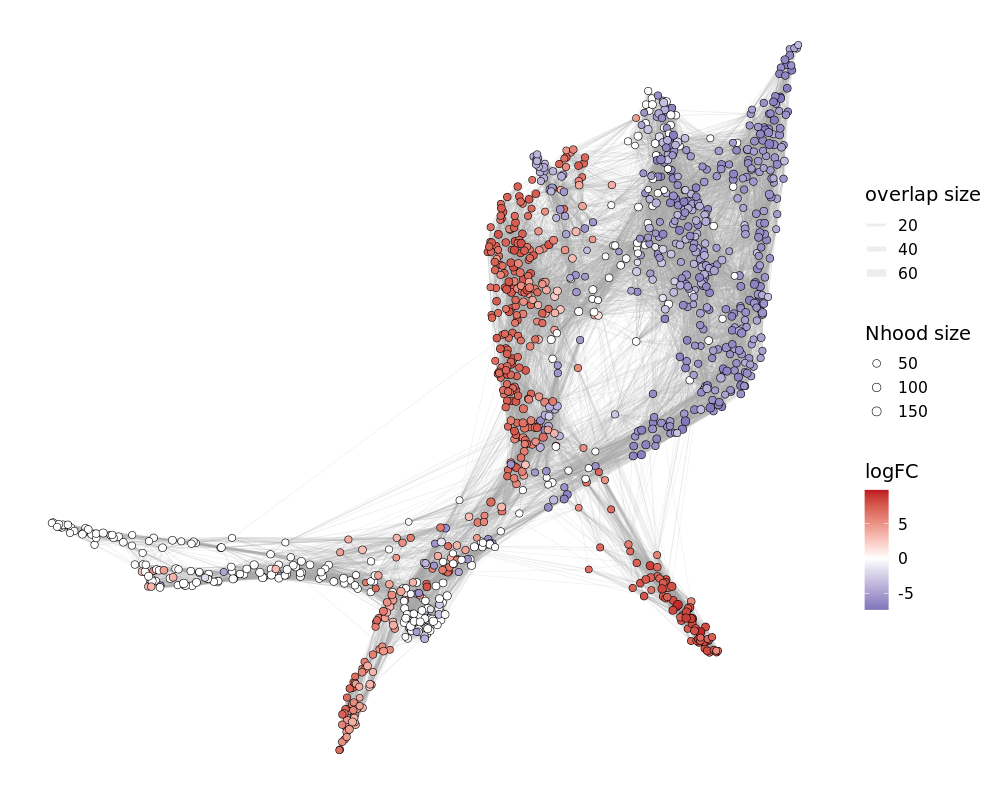

In [ ]:
%%R -w 1000 -h 800 -r 100

plotNhoodGraphDA(milo, DA_results,  alpha=.1,size_range=c(2,3),res_column="logFC.late_vs_all", layout="X_draw_graph_fa")+
  scale_fill_gradient2(high='#be1622', mid='white', low="#534ca3", name="logFC")+ theme(
  panel.background = element_rect(fill = "transparent",
                                  colour = NA_character_), # necessary to avoid drawing panel outline
  panel.grid.major = element_blank(), # get rid of major grid
  panel.grid.minor = element_blank(), # get rid of minor grid
  plot.background = element_rect(fill = "transparent",
                                 colour = NA_character_), # necessary to avoid drawing plot outline
  legend.background = element_rect(fill = "transparent"),
)

In [ ]:
%%R
ggsave(
  paste0(figDir,"/DA.logFC.late_vs_all.png"),
  plot = last_plot(),
  device = "png",
  scale = 1,bg = "transparent",
  width = 2200,
  height = 1640,
  units = c("px"),
  dpi = 300)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


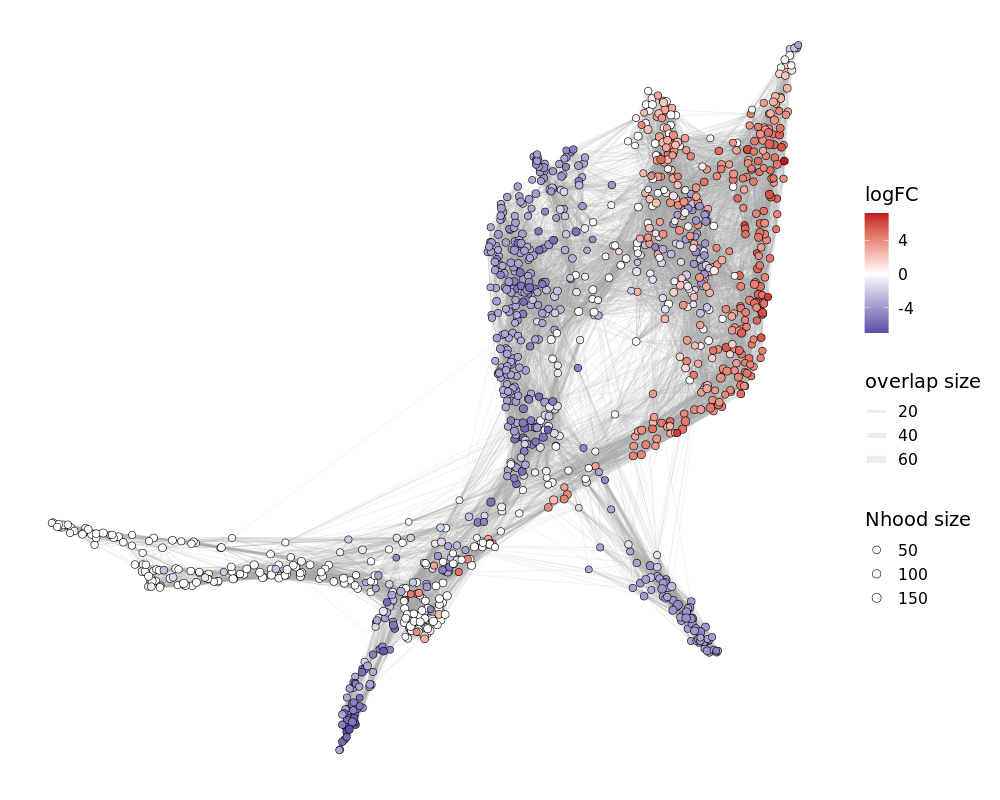

In [ ]:
%%R -w 1000 -h 800 -r 100


plotNhoodGraphDA(milo, DA_results,  alpha=.1,size_range=c(2,3),res_column="logFC.early_vs_all", layout="X_draw_graph_fa")+
  scale_fill_gradient2(high='#be1622', mid='white', low="#534ca3", name="logFC")+ theme(
  panel.background = element_rect(fill = "transparent",
                                  colour = NA_character_), # necessary to avoid drawing panel outline
  panel.grid.major = element_blank(), # get rid of major grid
  panel.grid.minor = element_blank(), # get rid of minor grid
  plot.background = element_rect(fill = "transparent",
                                 colour = NA_character_), # necessary to avoid drawing plot outline
  legend.background = element_rect(fill = "transparent"),
)

In [ ]:
%%R

ggsave(
    paste0(figDir,"/DA.logFC.early_vs_all.png"),
  plot = last_plot(),
  device = "png",
  scale = 1,bg = "transparent",
  width = 2200,
  height = 1640,
  units = c("px"),
  dpi = 300)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


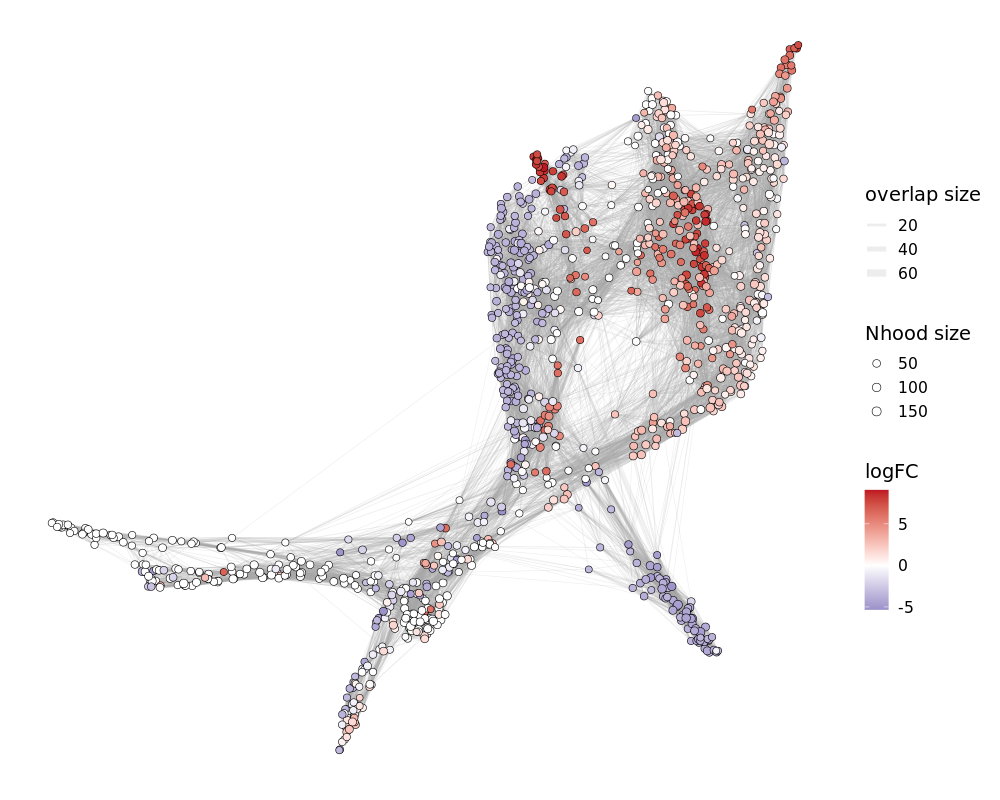

In [ ]:
%%R -w 1000 -h 800 -r 100

plotNhoodGraphDA(milo, DA_results,  alpha=.1,size_range=c(2,3),res_column="logFC.mid_vs_all", layout="X_draw_graph_fa")+
  scale_fill_gradient2(high='#be1622', mid='white', low="#534ca3", name="logFC")+ theme(
  panel.background = element_rect(fill = "transparent",
                                  colour = NA_character_), # necessary to avoid drawing panel outline
  panel.grid.major = element_blank(), # get rid of major grid
  panel.grid.minor = element_blank(), # get rid of minor grid
  plot.background = element_rect(fill = "transparent",
                                 colour = NA_character_), # necessary to avoid drawing plot outline
  legend.background = element_rect(fill = "transparent"),
)

In [ ]:
%%R


ggsave(
        paste0(figDir,"/DA.logFC.mid_vs_all.png"),
  plot = last_plot(),
  device = "png",
  scale = 1,bg = "transparent",
  width = 2200,
  height = 1640,
  units = c("px"),
  dpi = 300)

In [ ]:
%%R -o nhoods
nhoods <- milo@nhoods

In [ ]:
DA_results

,logFC.late_vs_all,logFC.mid_vs_all,logFC.early_vs_all,logCPM,F,PValue,FDR,Nhood,SpatialFDR
1,2.692140,-5.211017,2.518877,9.283284,2.041241,0.129986,0.159401,1.0,0.156349
2,-6.304006,2.632928,3.671079,10.132353,4.528253,0.010848,0.019429,2.0,0.019093
3,-5.185975,0.484936,4.701039,9.692885,4.141955,0.015952,0.026774,3.0,0.026240
4,-6.189369,2.879279,3.310091,10.028704,4.036426,0.017724,0.029274,4.0,0.028747
5,-2.083283,0.495335,1.587948,9.666917,0.875516,0.416717,0.459074,5.0,0.451941
...,...,...,...,...,...,...,...,...,...
1134,-0.342064,-0.613208,0.955272,10.407881,0.403690,0.667875,0.701793,1134.0,0.694615
1135,2.438576,-0.183092,-2.255484,10.751215,3.503312,0.030179,0.045852,1135.0,0.044911
1136,-5.617211,1.283279,4.333931,9.806550,3.970403,0.018931,0.031043,1136.0,0.030478
1137,7.795414,-3.897707,-3.897707,10.331951,13.029206,0.000002,0.000019,1137.0,0.000020


# Retrieve cells ID belonging to nhoods with >= 2logfc & <= 0.01 FDR per stage

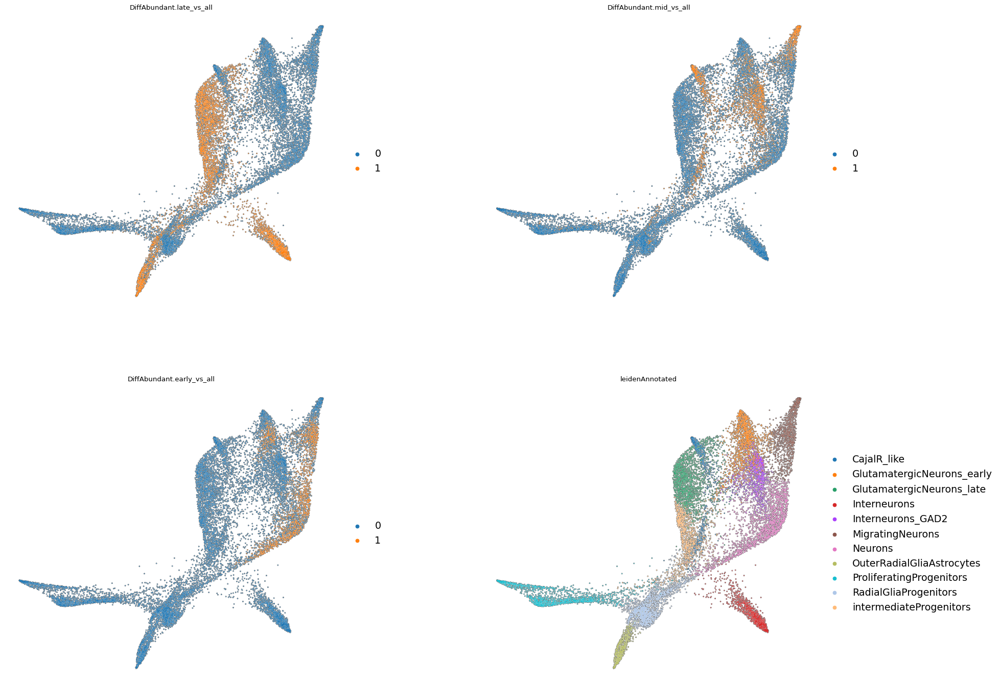

In [ ]:
FDRthreshold = 0.005
FCthrehsold = 3

for contrast in [col.split(".")[1] for col in  DA_results.columns if "logFC" in col]:
    Neighbmask = (DA_results["logFC."+contrast] > FCthrehsold) & (DA_results["SpatialFDR"] < FDRthreshold)
    DAcells = adata_no_knn.obs_names[(nhoods[:,Neighbmask].sum(axis = 1) > 0).A1].tolist()
    adataComp.obs["DiffAbundant."+contrast] = 0
    adataComp.obs.loc[DAcells, "DiffAbundant."+contrast] = 1  
    adataComp.obs["DiffAbundant."+contrast] = adataComp.obs["DiffAbundant."+contrast].astype("str")
    
sc.pl.draw_graph(adataComp, color = ["DiffAbundant."+col.split(".")[1] for col in  DA_results.columns if "logFC" in col]+["leidenAnnotated"],ncols=2, 
           size = 10,add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98',  frameon=False, wspace=.3, legend_fontsize='xx-large')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
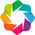

:Sankey   [leidenAnnotated,DiffAbundant.mid_vs_all]   (count)

In [ ]:
import holoviews as hv
obsTupleToMap = ("leidenAnnotated","DiffAbundant.mid_vs_all")
SankeyDF=adataComp.obs[list(obsTupleToMap)]
SankeyDF.columns = ["leidenAnnotated","DiffAbundant.mid_vs_all"]
SankeyDF = SankeyDF.groupby(['leidenAnnotated','DiffAbundant.mid_vs_all']).size().reset_index().rename(columns={0:'count'})
SankeyDF=SankeyDF[SankeyDF["count"] != 0]
hv.extension('bokeh')




sankey1 = hv.Sankey(SankeyDF, kdims=["leidenAnnotated", "DiffAbundant.mid_vs_all"], vdims="count")



sankey1.opts(cmap='Colorblind',label_position='outer',
edge_color='leidenAnnotated', edge_line_width=0,
node_alpha=1.0, node_width=40, node_sort=True,
width=1100, height=700, bgcolor="white")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
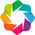

:Sankey   [leidenAnnotated,DiffAbundant.late_vs_all]   (count)

In [ ]:
obsTupleToMap = ("leidenAnnotated","DiffAbundant.late_vs_all")
SankeyDF=adataComp.obs[list(obsTupleToMap)]
SankeyDF.columns = ["leidenAnnotated","DiffAbundant.late_vs_all"]
SankeyDF = SankeyDF.groupby(['leidenAnnotated','DiffAbundant.late_vs_all']).size().reset_index().rename(columns={0:'count'})
SankeyDF=SankeyDF[SankeyDF["count"] != 0]
hv.extension('bokeh')




sankey1 = hv.Sankey(SankeyDF, kdims=["leidenAnnotated", "DiffAbundant.late_vs_all"], vdims="count")



sankey1.opts(cmap='Colorblind',label_position='outer',
edge_color='leidenAnnotated', edge_line_width=0,
node_alpha=1.0, node_width=40, node_sort=True,
width=1100, height=700, bgcolor="white")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
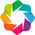

:Sankey   [leidenAnnotated,DiffAbundant.early_vs_all]   (count)

In [ ]:
obsTupleToMap = ("leidenAnnotated","DiffAbundant.early_vs_all")
SankeyDF=adataComp.obs[list(obsTupleToMap)]
SankeyDF.columns = ["leidenAnnotated","DiffAbundant.early_vs_all"]
SankeyDF = SankeyDF.groupby(['leidenAnnotated','DiffAbundant.early_vs_all']).size().reset_index().rename(columns={0:'count'})
SankeyDF=SankeyDF[SankeyDF["count"] != 0]
hv.extension('bokeh')




sankey1 = hv.Sankey(SankeyDF, kdims=["leidenAnnotated", "DiffAbundant.early_vs_all"], vdims="count")



sankey1.opts(cmap='Colorblind',label_position='outer',
edge_color='leidenAnnotated', edge_line_width=0,
node_alpha=1.0, node_width=40, node_sort=True,
width=1100, height=700, bgcolor="white")

# Heatmap

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leidenAnnotated']`


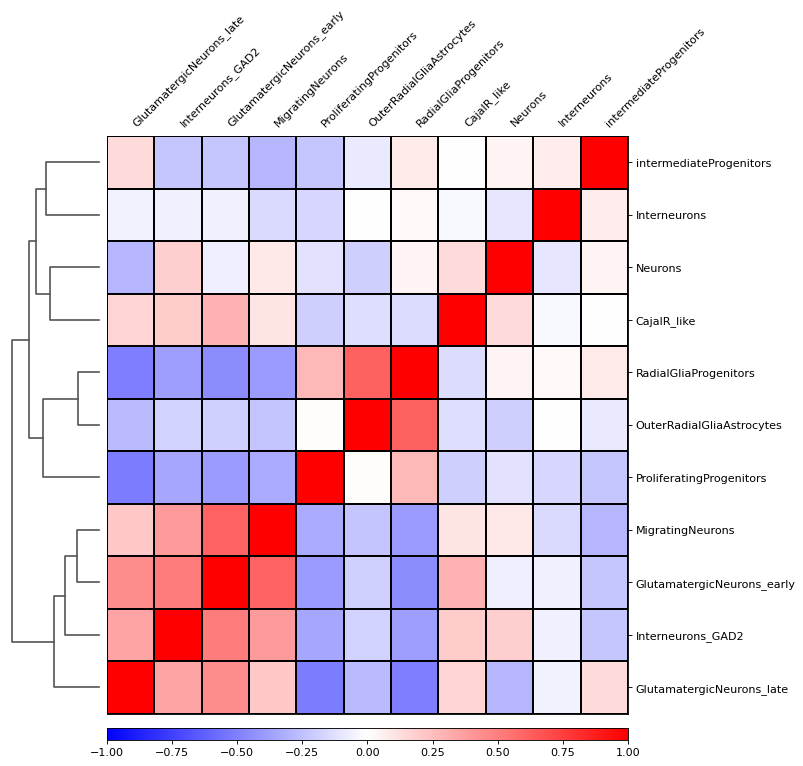

In [ ]:
sc.pl.correlation_matrix(adataComp, 'leidenAnnotated', figsize=(10,10), dendrogram=True)

In [ ]:
adataCompCellXgene = adataComp.raw.to_adata().copy()

In [ ]:
adataCompCellXgene.write_h5ad(outdir+"/adatas/adataComp_cellXgene.h5ad")

In [ ]:
adataComp.raw.to_adata().X

<14913x33538 sparse matrix of type '<class 'numpy.float32'>'
	with 31521790 stored elements in Compressed Sparse Row format>

In [ ]:
# Interneurons scatter

tmp = pd.DataFrame(adataComp[adataComp.obs["leidenAnnotated"] == "Interneurons_GAD2"].X.T, 
            index = adataComp[adataComp.obs["leidenAnnotated"] == "Interneurons_GAD2"].var_names,
        columns = adataComp[adataComp.obs["leidenAnnotated"] == "Interneurons_GAD2"].obs_names).loc[["DLX2","DLX5","DLX6-AS1","GAD1","GAD2","SLC32A1","SLC17A7","SLC17A6","SLC17A8","NNAT","GRIN1","GRIN2B","GRID2","GRIA1","GRIA2","SLC2A1","NOVA1", "CUX1"]].T


<AxesSubplot:xlabel='GAD1', ylabel='CUX1'>

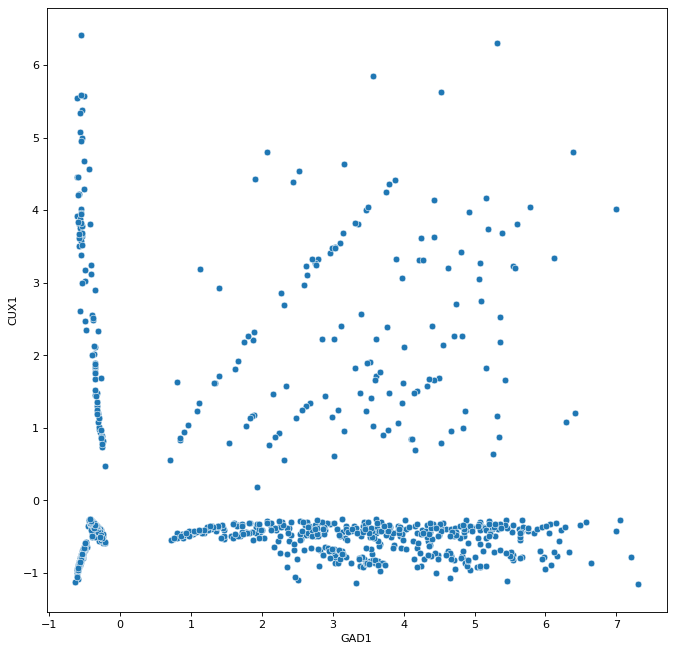

In [ ]:
sns.scatterplot(data=tmp, x="GAD1", y="CUX1")